In [26]:
import sklearn.datasets
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_20newsgroups
import seaborn as sns
from collections import defaultdict
import time
import math
import trimap
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
import umap.umap_ as umap

In [19]:
def calculate_average_distance_inside_class(x, y):
    distances = []
    for i in range(0, x.shape[0]):
        class_a = y[i]
        x_a, y_a = x[i, 0], x[i, 1]
        for j in range(i, x.shape[0]):
            class_b = y[j]
            x_b, y_b = x[j, 0], x[j, 1]
            if class_a == class_b:
                distances.append(math.sqrt((y_b - y_a)**2 + (x_b - x_a)**2))
    return sum(distances) / len(distances)

def calculate_average_distance_outside_class(x, y):
    distances = []
    for i in range(0, x.shape[0]):
        class_a = y[i]
        x_a, y_a = x[i, 0], x[i, 1]
        for j in range(i, x.shape[0]):
            class_b = y[j]
            x_b, y_b = x[j, 0], x[j, 1]
            if class_a != class_b:
                distances.append(math.sqrt((y_b - y_a)**2 + (x_b - x_a) **2))
    return sum(distances) / len(distances)

def calculate_metric(x, y):
    return calculate_average_distance_inside_class(x, y)/calculate_average_distance_outside_class(x, y)

# MNIST

In [92]:
mnist = sklearn.datasets.fetch_openml('mnist_784')

In [94]:
x = mnist.data 
y = mnist.target

df_x = pd.DataFrame(x)
df_y = pd.DataFrame(y)
size_of_data = 10000
x_mnist = df_x.iloc[:size_of_data, :].values
y_mnist = df_y.iloc[:size_of_data, -1]
y_mnist = np.array(y_mnist.values).astype('int')
x_mnist = x_mnist /255

## TriMap (mnist)

In [95]:
import trimap
from sklearn.datasets import load_digits


start=time.time()
embedding = trimap.TRIMAP(n_inliers=20,
                          n_outliers=10,
                          n_random=10,
                          weight_adj=1000.0).fit_transform(x_mnist)
total_time=time.time()-start

TRIMAP(n_inliers=20, n_outliers=10, n_random=10, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=1000.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 10000 points with dimension 784
pre-processing
applied PCA
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 1885.890, Violated triplets: 0.0898
Iteration:  200, Loss: 1793.264, Violated triplets: 0.0854
Iteration:  300, Loss: 1738.722, Violated triplets: 0.0828
Iteration:  400, Loss: 1703.810, Violated triplets: 0.0811
Elapsed time: 0:00:33.154574


In [96]:
def plot_2d_mnist_scatter(X, y):
    fig, plot = plt.subplots()
    fig.set_size_inches(20, 10)
    plt.prism()

    for i in range(10):
        digit_indices = (y == i)
        dim1 = X.shape[0]
        dim2 = X.shape[1]
        plot.scatter(X[digit_indices, 0], X[digit_indices, 1], label = str(i))
        


    plot.set_xticks(())
    plot.set_yticks(())

    plt.tight_layout()
    plt.legend()
    plt.show()

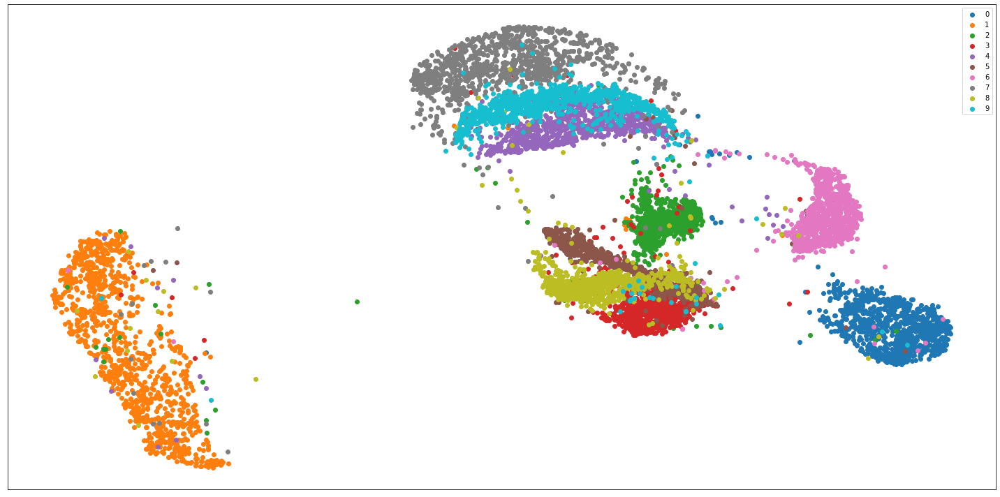

In [6]:
plot_2d_mnist_scatter(embedding, y_mnist)

In [99]:
gs = trimap.TRIMAP(verbose=False).global_score(x_mnist, embedding)
print("global score %2.2f" % gs)
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(embedding, y_mnist))

global score 0.93
Time 33.23
Average distance inside/outside class ratio 0.25


## t-SNE (mnist)

In [100]:
start=time.time()
tsne = TSNE(verbose=2)
x_tsne= tsne.fit_transform(x_mnist)
total_time=time.time()-start

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.011s...
[t-SNE] Computed neighbors for 10000 samples in 3.218s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.039356
[t-SNE] Computed conditional probabilities in 0.562s
[t-SNE] Iteration 50: error = 97.1823349, gradient norm = 0.0004521 (50 iterations in 2.380s)
[t-SNE] It

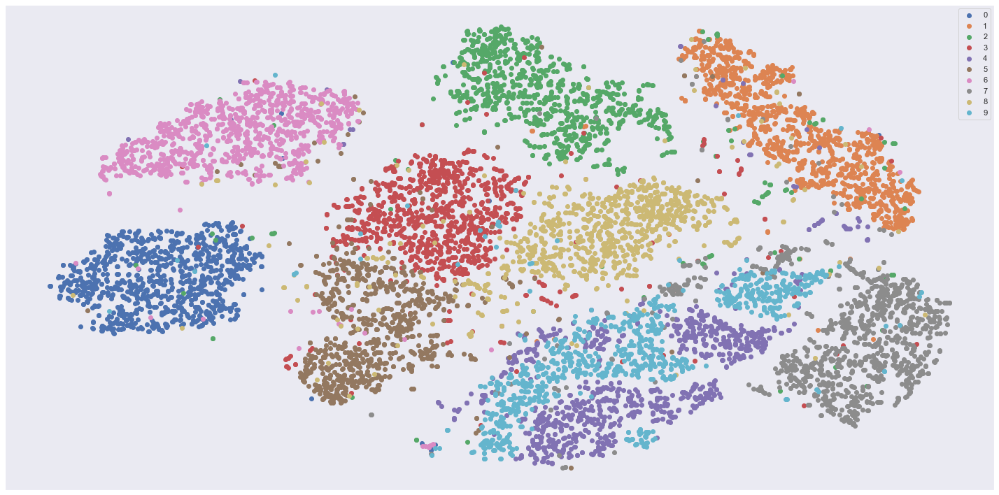

In [101]:
plot_2d_mnist_scatter(x_tsne, y_mnist)

In [102]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(x_tsne, y_mnist))

Time 45.51
Average distance inside/outside class ratio 0.34


## UMAP (mnist)

In [103]:
import umap.umap_ as umap
start=time.time()
mnist_reducer = umap.UMAP()
mnist_embedding = mnist_reducer.fit_transform(x_mnist)
total_time=time.time()-start

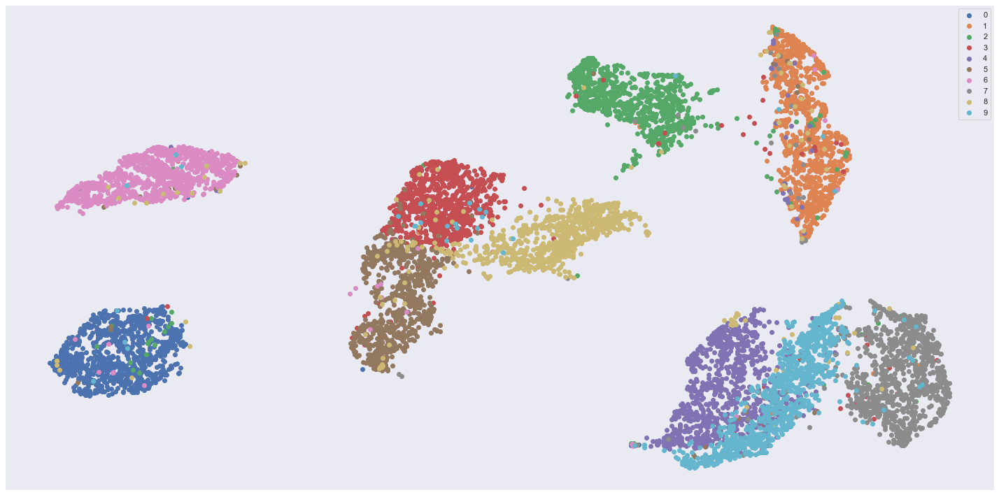

In [104]:
plot_2d_mnist_scatter(mnist_embedding, y_mnist)

In [105]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(mnist_embedding, y_mnist))

Time 31.98
Average distance inside/outside class ratio 0.23


## PCA (mnist)

In [ ]:
from sklearn.decomposition import PCA
start=time.time()
pca_mnist = PCA(n_components=2)
X_pca = pca_mnist.fit_transform(x_mnist)
total_time=time.time()-start

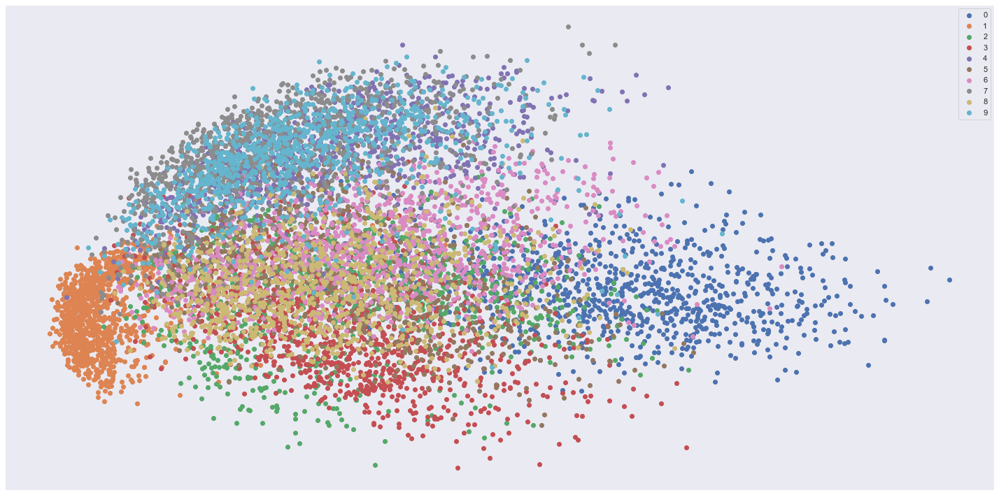

In [107]:
plot_2d_mnist_scatter(X_pca, y_mnist)

In [108]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(X_pca, y_mnist))

Time 0.18
Average distance inside/outside class ratio 0.57


## LargeVis (mnist)

In [109]:
np.savetxt('mnist_vec784D_trimap.txt', x_mnist, delimiter=' ')
np.savetxt('mnist_label_trimap.txt', y_mnist, delimiter=' ')

In [110]:
with open('mnist_vec784D_trimap.txt', 'r') as original: data = original.read()
with open('mnist_vec784D_trimap.txt', 'w') as modified: 
    modified.write(str(x_mnist.shape[0]) + " " + str(x_mnist.shape[1]) + '\n')
    modified.write(data)

In [111]:
start = time.time()
!start LargeVis.exe -input mnist_vec784D_trimap.txt -output mnist_vec2D_trimap.txt -threads 15

In [112]:
file_data = np.loadtxt("mnist_vec2D_trimap.txt", dtype=float)
sliced = file_data[1:,:]
total_time=time.time()-start

<AxesSubplot:>

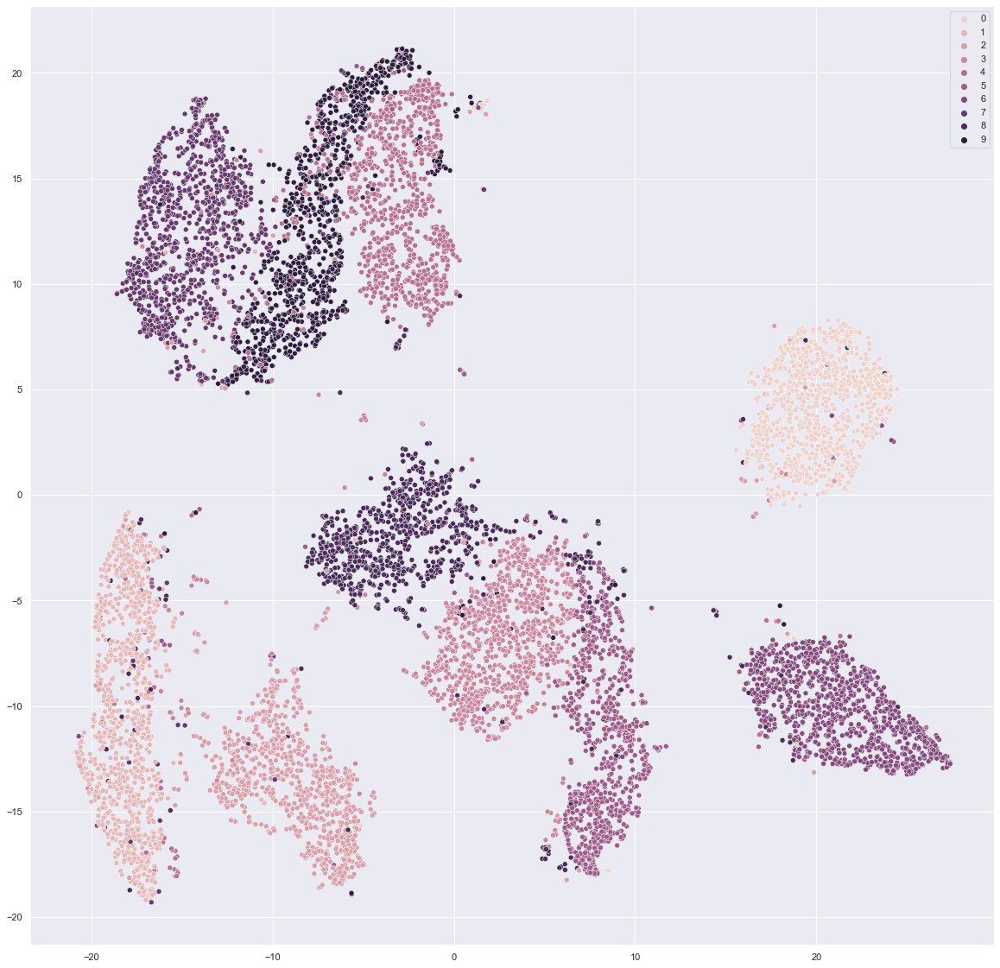

In [113]:
sns.set(rc={'figure.figsize':(20,20)})
palette = sns.color_palette("hls", len(set(y_mnist))) 
sns.scatterplot(sliced[:,0],sliced[:,1], hue=y_mnist, legend='full')

In [115]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(sliced, y_mnist))

Time 425.17
Average distance inside/outside class ratio 0.27


# 20 News Group

In [116]:
news_group_dataset = fetch_20newsgroups()

In [117]:
news_group_dataset.keys()

dict_keys(['data', 'filenames', 'target_names', 'target', 'DESCR'])

In [118]:
news_group_df = pd.DataFrame()
news_group_df["data"] = news_group_dataset["data"]
news_group_df["target"] = news_group_dataset["target"]
news_group_df["target_names"] = news_group_df.target.apply(lambda row: news_group_dataset["target_names"][row])
news_group_df.head()

,data,target,target_names
0,From: lerxst@wam.umd.edu (where's my thing)\nS...,7,rec.autos
1,From: guykuo@carson.u.washington.edu (Guy Kuo)...,4,comp.sys.mac.hardware
2,From: twillis@ec.ecn.purdue.edu (Thomas E Will...,4,comp.sys.mac.hardware
3,From: jgreen@amber (Joe Green)\nSubject: Re: W...,1,comp.graphics
4,From: jcm@head-cfa.harvard.edu (Jonathan McDow...,14,sci.space


## Text cleaning

In [119]:
from textblob import Word
from nltk.corpus import stopwords
import nltk
import re

In [120]:
nltk.download("stopwords")
nltk.download("wordnet")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Piotr\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Piotr\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [121]:
def clean_text(text):
    return " ".join([ Word(word).lemmatize() for word in re.sub("[^A-Za-z0-9]+", " ", text).lower().split() if word not in stopword])    

In [122]:
stopword = stopwords.words('english')

In [123]:
news_group_df["data_str"] = news_group_df.data.apply(lambda row: clean_text(row) )

In [124]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [125]:
vectorizer = TfidfVectorizer(max_features= 2**10)
to_vector = vectorizer.fit_transform(news_group_df["data_str"])

## t-SNE (news dataset)

In [126]:
start=time.time()
X_embedded = TSNE(verbose=2).fit_transform(to_vector)
total_time=time.time()-start

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11314 samples in 0.003s...
[t-SNE] Computed neighbors for 11314 samples in 8.783s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11314
[t-SNE] Computed conditional probabilities for sample 2000 / 11314
[t-SNE] Computed conditional probabilities for sample 3000 / 11314
[t-SNE] Computed conditional probabilities for sample 4000 / 11314
[t-SNE] Computed conditional probabilities for sample 5000 / 11314
[t-SNE] Computed conditional probabilities for sample 6000 / 11314
[t-SNE] Computed conditional probabilities for sample 7000 / 11314
[t-SNE] Computed conditional probabilities for sample 8000 / 11314
[t-SNE] Computed conditional probabilities for sample 9000 / 11314
[t-SNE] Computed conditional probabilities for sample 10000 / 11314
[t-SNE] Computed conditional probabilities for sample 11000 / 11314
[t-SNE] Computed conditional probabilities for sample 11314 / 11314
[t-SNE] Mean sigma: 0.348912
[t-SNE] Computed cond

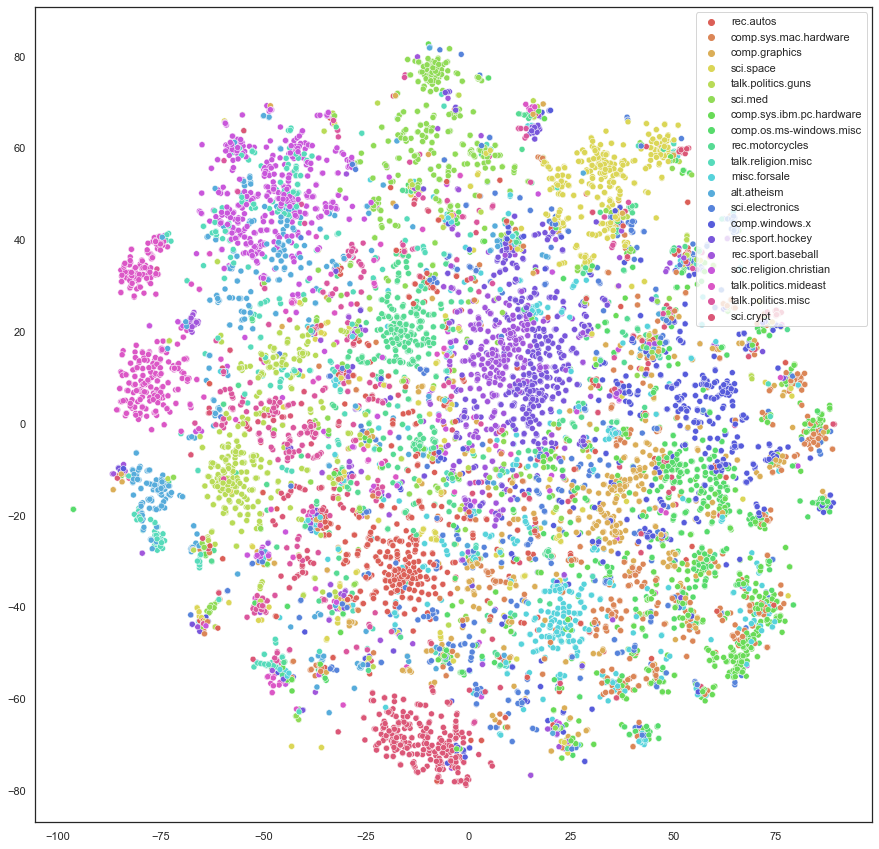

In [127]:
sns.set(rc={'figure.figsize':(15,15)})
sns.set_style("white")
# colors
palette = sns.color_palette("hls", len(set(news_group_df.target_names.values.tolist())))        
y = news_group_df.target_names.values.tolist()
# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [129]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(X_embedded, y))

Time 57.50
Average distance inside/outside class ratio 0.64


## PCA (news dataset) 

In [130]:
from sklearn.decomposition import PCA
start=time.time()
x_pca = PCA(n_components=2)
x_pca.fit(to_vector.toarray())
pca_news = x_pca.transform(to_vector.toarray())
total_time=time.time()-start

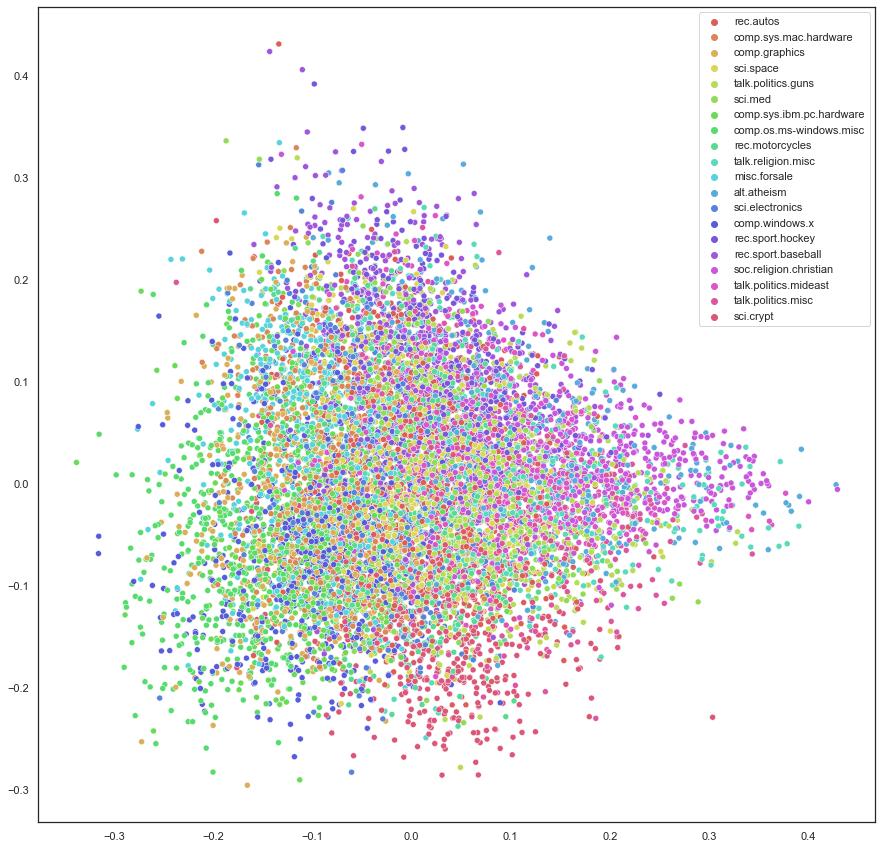

In [131]:
sns.set(rc={'figure.figsize':(15,15)})
sns.set_style("white")
# colors
palette = sns.color_palette("hls", len(set(news_group_df.target_names.values.tolist())))        
y = news_group_df.target_names.values.tolist()
# plot
sns.scatterplot(pca_news[:,0], pca_news[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [133]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(pca_news, y))

Time 1.08
Average distance inside/outside class ratio 0.74


## TriMap (news dataset)

In [134]:
import trimap
start=time.time()
embedding_news = trimap.TRIMAP(n_inliers=20,
                          n_outliers=10,
                          n_random=10,
                          weight_adj=1000.0).fit_transform(to_vector.toarray())
total_time=time.time()-start

TRIMAP(n_inliers=20, n_outliers=10, n_random=10, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=1000.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 11314 points with dimension 1024
pre-processing
applied PCA
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 3279.115, Violated triplets: 0.1380
Iteration:  200, Loss: 3192.538, Violated triplets: 0.1344
Iteration:  300, Loss: 3147.229, Violated triplets: 0.1325
Iteration:  400, Loss: 3118.824, Violated triplets: 0.1313
Elapsed time: 0:00:37.327466


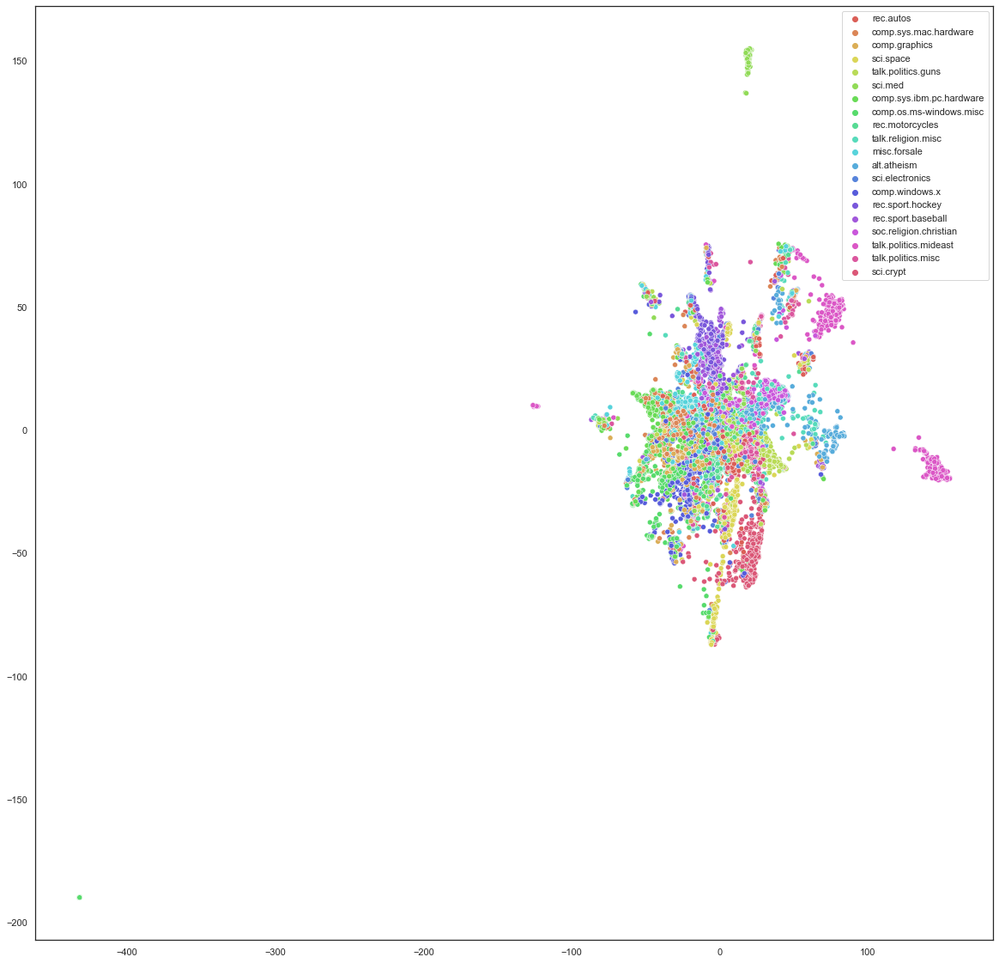

In [135]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_style("white")
# colors
palette = sns.color_palette("hls", len(set(news_group_df.target_names.values.tolist())))        
y = news_group_df.target_names.values.tolist()
# plot
sns.scatterplot(embedding_news[:,0],embedding_news[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [136]:
gs = trimap.TRIMAP(verbose=False).global_score(to_vector.toarray(), embedding_news)
print("global score %2.2f" % gs)
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(embedding_news, y))

global score 0.99
Time 38.09
Average distance inside/outside class ratio 0.67


## UMAP (news dataset)

In [137]:
import umap.umap_ as umap
start=time.time()
news_reducer = umap.UMAP()
news_embedding = news_reducer.fit_transform(to_vector)
total_time=time.time()-start

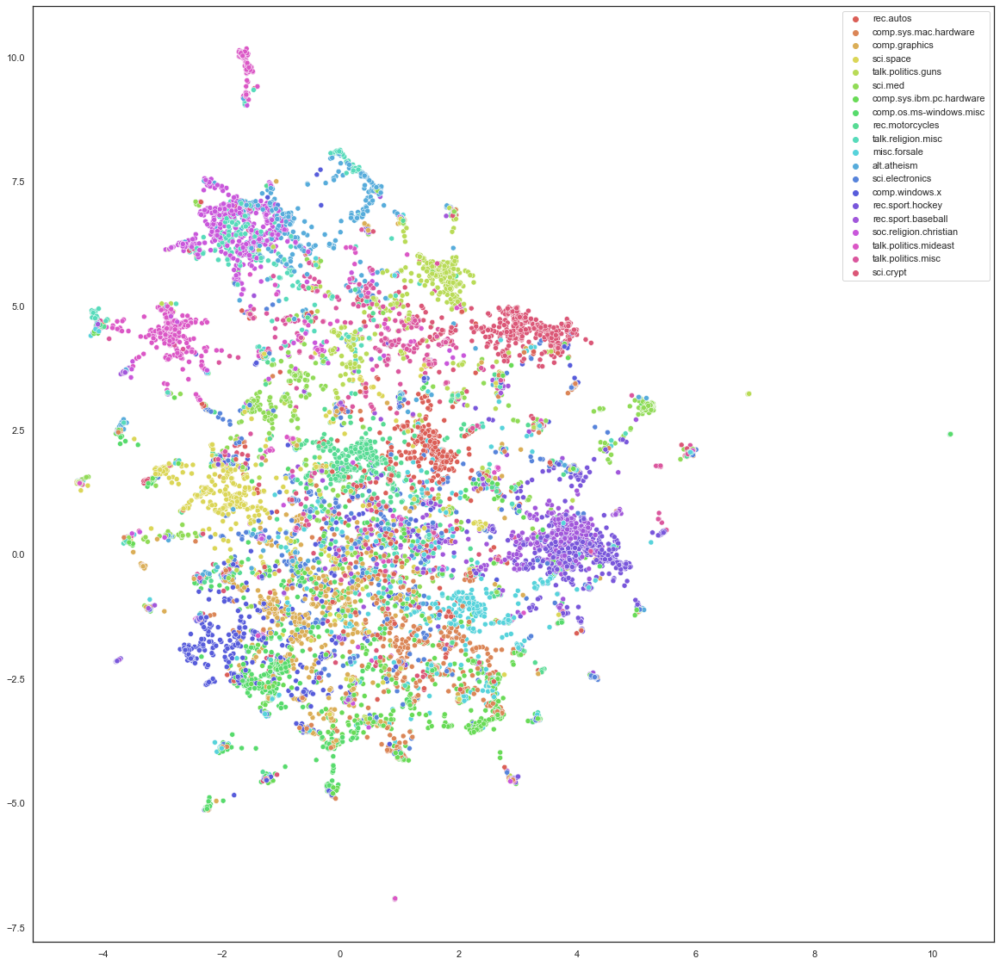

In [138]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_style("white")
# colors
palette = sns.color_palette("hls", len(set(news_group_df.target_names.values.tolist())))        
y = news_group_df.target_names.values.tolist()
# plot
sns.scatterplot(news_embedding[:,0],news_embedding[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [139]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(news_embedding, y))

Time 64.97
Average distance inside/outside class ratio 0.63


## LargeVis (news dataset)

In [140]:
news_group_df.target_names.values.tolist()

['rec.autos',
 'comp.sys.mac.hardware',
 'comp.sys.mac.hardware',
 'comp.graphics',
 'sci.space',
 'talk.politics.guns',
 'sci.med',
 'comp.sys.ibm.pc.hardware',
 'comp.os.ms-windows.misc',
 'comp.sys.mac.hardware',
 'rec.motorcycles',
 'talk.religion.misc',
 'comp.sys.mac.hardware',
 'sci.space',
 'misc.forsale',
 'alt.atheism',
 'comp.graphics',
 'rec.autos',
 'sci.electronics',
 'comp.windows.x',
 'alt.atheism',
 'rec.sport.hockey',
 'misc.forsale',
 'comp.os.ms-windows.misc',
 'comp.sys.mac.hardware',
 'comp.graphics',
 'sci.electronics',
 'rec.sport.baseball',
 'soc.religion.christian',
 'rec.autos',
 'misc.forsale',
 'sci.med',
 'sci.electronics',
 'talk.politics.mideast',
 'talk.politics.misc',
 'rec.sport.hockey',
 'rec.motorcycles',
 'sci.crypt',
 'rec.motorcycles',
 'talk.politics.guns',
 'rec.sport.baseball',
 'comp.sys.mac.hardware',
 'comp.sys.ibm.pc.hardware',
 'rec.sport.baseball',
 'rec.sport.baseball',
 'comp.sys.mac.hardware',
 'comp.sys.mac.hardware',
 'rec.motorcycl

In [141]:
np.savetxt('news_vec784D_trimap.txt', to_vector.toarray(), delimiter=' ')
np.savetxt('news_label_trimap.txt', news_group_df.target_names.values, delimiter=' ', fmt='%s')

In [142]:
with open('news_vec784D_trimap.txt', 'r') as original: data = original.read()
with open('news_vec784D_trimap.txt', 'w') as modified: 
    modified.write(str(len(to_vector.toarray())) + ' 1 \n')
    modified.write(data)

In [143]:
start = time.time()
!start LargeVis.exe -input news_vec784D_trimap.txt -output news_vec2D_trimap.txt -threads 15

In [146]:
file_data = np.loadtxt("news_vec2D_trimap.txt", dtype=float)
sliced = file_data[1:,:]
total_time=time.time()-start

<AxesSubplot:>

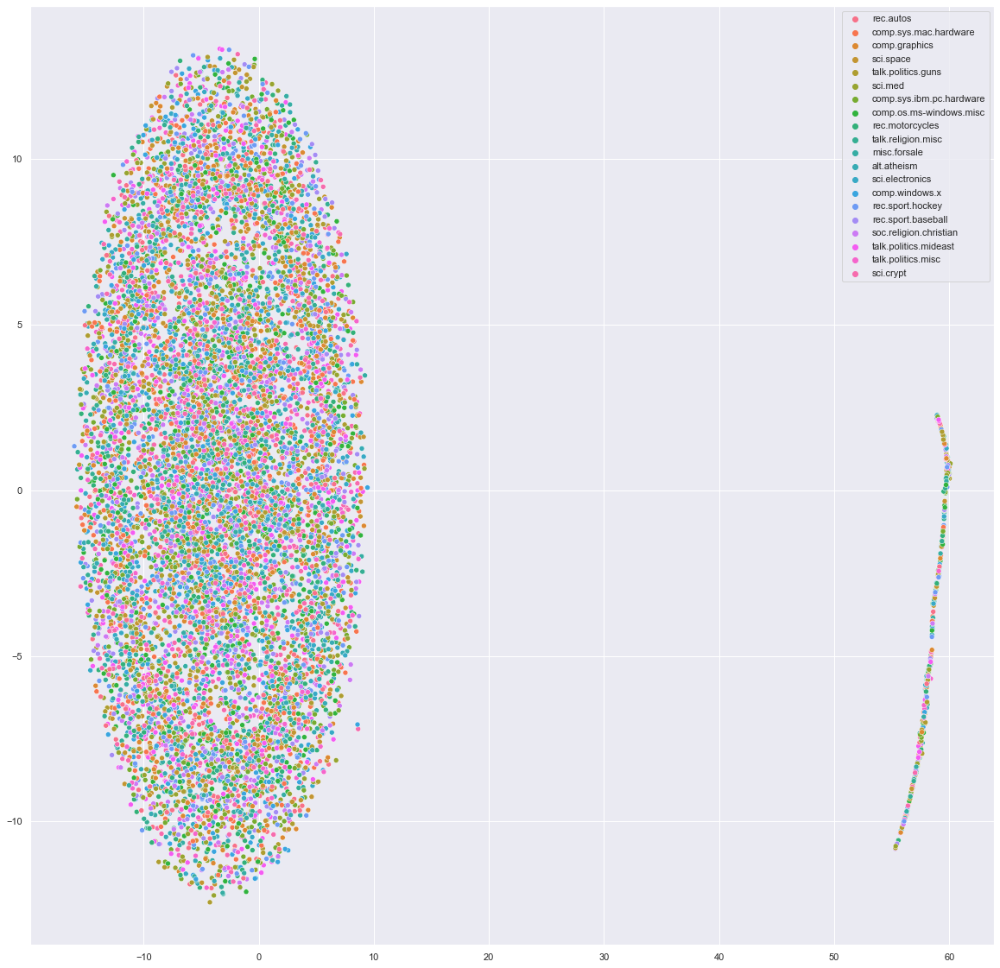

In [157]:
sns.set(rc={'figure.figsize':(20,20)})
palette = sns.color_palette("hls", len(set(news_group_df.target_names.values))) 
sns.scatterplot(sliced[:,0],sliced[:,1], hue=news_group_df.target_names.values, legend='full')

In [158]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(sliced, news_group_df.target_names))

Time 49.84
Average distance inside/outside class ratio 1.00


# Fashion-MNIST

In [150]:
fmnist = sklearn.datasets.fetch_openml('Fashion-MNIST')
fmnist_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

In [151]:
x = fmnist.data 
y = fmnist.target

df_x = pd.DataFrame(x)
df_y = pd.DataFrame(y)
x_fmnist = df_x.iloc[:10000,:].values
y_fmnist = df_y.iloc[:10000,-1]
y_fmnist = np.array(y_fmnist.values).astype('int')
x_fmnist = x_fmnist /255

## TriMap (fmnist)

In [152]:
start=time.time()
embedding_fmnist = trimap.TRIMAP(n_inliers=20,
                          n_outliers=10,
                          n_random=10,
                          weight_adj=1000.0).fit_transform(x_fmnist)
total_time=time.time()-start

TRIMAP(n_inliers=20, n_outliers=10, n_random=10, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=1000.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 10000 points with dimension 784
pre-processing
applied PCA
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 1361.730, Violated triplets: 0.0648
Iteration:  200, Loss: 1279.983, Violated triplets: 0.0610
Iteration:  300, Loss: 1232.758, Violated triplets: 0.0587
Iteration:  400, Loss: 1203.547, Violated triplets: 0.0573
Elapsed time: 0:00:49.053895


In [153]:
def plot_scatter_for_fmnist(X, y):
    fig, plot = plt.subplots()
    fig.set_size_inches(20, 10)
    plt.prism()
    for i, label in zip(range(10), fmnist_names):
        display_n = y == i
        plt.scatter(X[display_n, 0], X[display_n, 1], label = f' {label}')
    plot.set_xticks(())
    plot.set_yticks(())
    

    plt.tight_layout()
    plt.legend()
    plt.show()

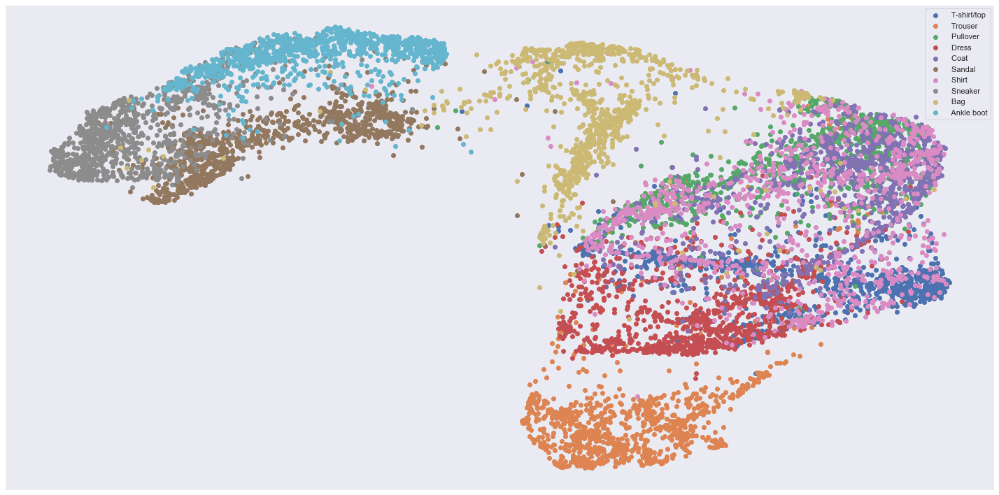

In [154]:
plot_scatter_for_fmnist(embedding_fmnist, y_fmnist)

In [155]:
gs = trimap.TRIMAP(verbose=False).global_score(x_fmnist, embedding_fmnist)
print("global score %2.2f" % gs)
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(embedding_fmnist, y_fmnist))

global score 0.88
Time 49.84
Average distance inside/outside class ratio 0.31


## t-SNE

In [159]:
start=time.time()
tsne_fmnist = TSNE(verbose=2)
x_tsne_fmnist = tsne_fmnist.fit_transform(x_fmnist)
total_time=time.time()-start

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.337s...
[t-SNE] Computed neighbors for 10000 samples in 4.876s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.698403
[t-SNE] Computed conditional probabilities in 0.737s
[t-SNE] Iteration 50: error = 96.0654602, gradient norm = 0.0040797 (50 iterations in 2.904s)
[t-SNE] It

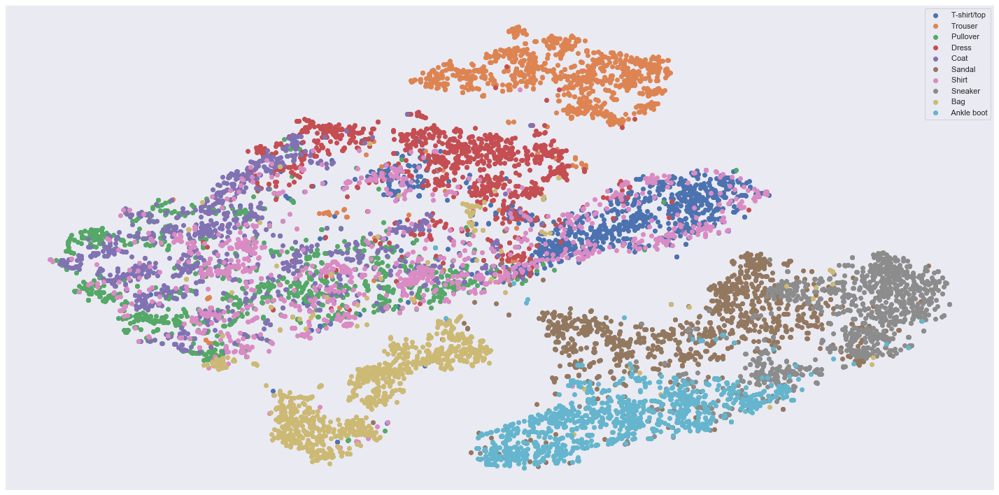

In [160]:
plot_scatter_for_fmnist(x_tsne_fmnist, y_fmnist)

In [161]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(x_tsne_fmnist, y_fmnist))

Time 52.99
Average distance inside/outside class ratio 0.39


## UMAP (fmnist) 

In [162]:
start=time.time()
fmnist_reducer = umap.UMAP()
fmnist_embedding = fmnist_reducer.fit_transform(x_fmnist)
total_time=time.time()-start

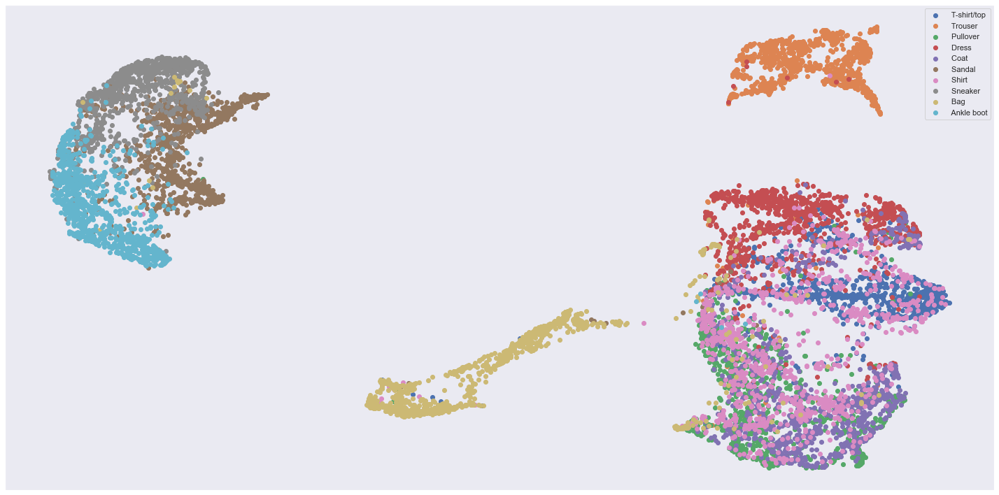

In [163]:
plot_scatter_for_fmnist(fmnist_embedding, y_fmnist)

In [164]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(fmnist_embedding, y_fmnist))

Time 95.78
Average distance inside/outside class ratio 0.25


## PCA (fmnist)

In [165]:
start=time.time()
pca_fmnist = PCA(n_components=2)
X_pca_fmnist = pca_fmnist.fit_transform(x_fmnist)
total_time=time.time()-start

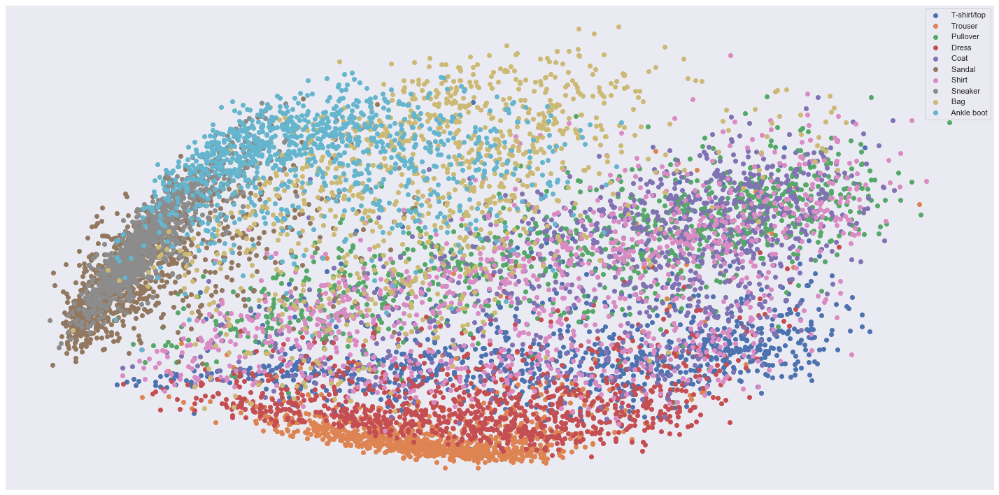

In [166]:
plot_scatter_for_fmnist(X_pca_fmnist, y_fmnist)

In [167]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(X_pca_fmnist, y_fmnist))

Time 0.47
Average distance inside/outside class ratio 0.51


## LargeVis (fmnist)

In [168]:
np.savetxt('fmnist_vec784D_trimap.txt', x_fmnist, delimiter=' ')
np.savetxt('fmnist_label_trimap.txt', y_fmnist, delimiter=' ')

In [169]:
with open('fmnist_vec784D_trimap.txt', 'r') as original: data = original.read()
with open('fmnist_vec784D_trimap.txt', 'w') as modified: 
    modified.write(str(x_fmnist.shape[0]) + " " + str(x_fmnist.shape[1]) + '\n')
    modified.write(data)

In [171]:
start = time.time()
!start LargeVis.exe -input fmnist_vec784D_trimap.txt -output fmnist_vec2D_trimap.txt -threads 15

In [174]:
total_time=time.time()-start
file_data = np.loadtxt("fmnist_vec2D_trimap.txt", dtype=float)
sliced = file_data[1:,:]

<AxesSubplot:>

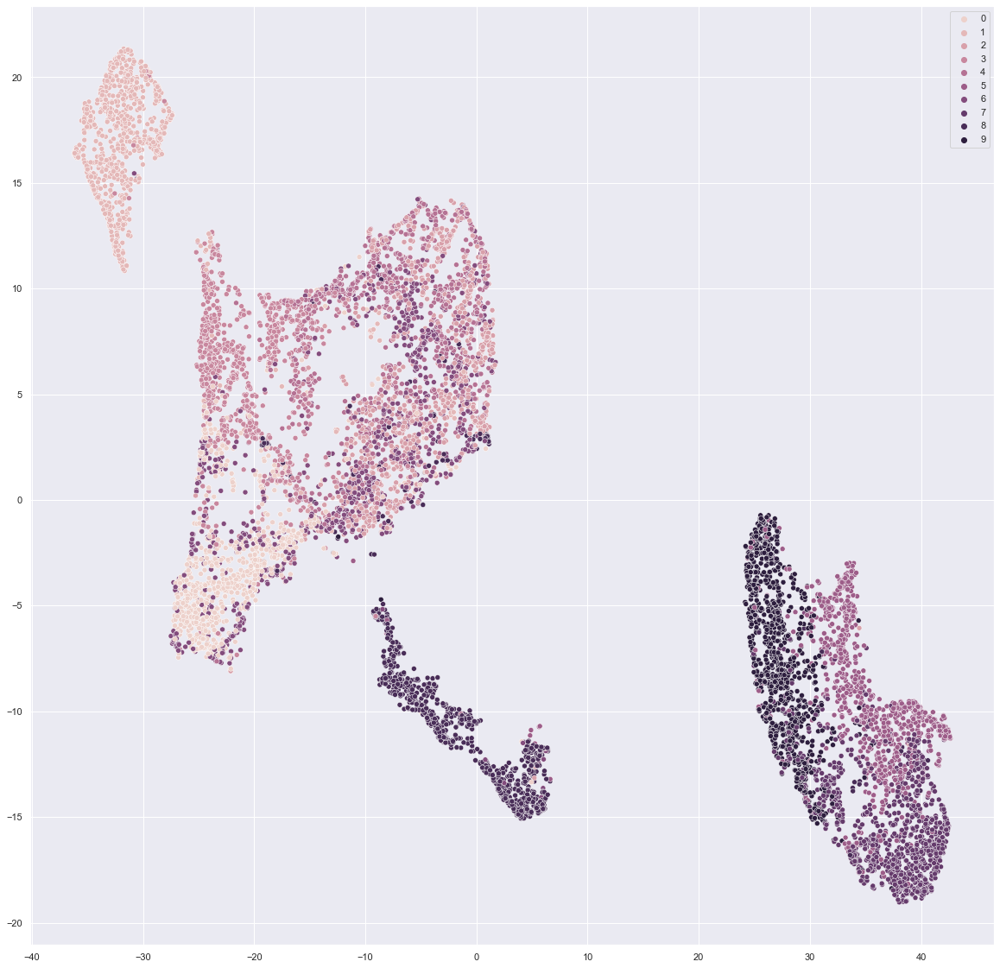

In [175]:
sns.set(rc={'figure.figsize':(20,20)})
palette = sns.color_palette("hls", len(set(y_fmnist))) 
sns.scatterplot(sliced[:,0],sliced[:,1], hue=y_fmnist, legend='full')

In [176]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(sliced, y_fmnist))

Time 461.62
Average distance inside/outside class ratio 0.23


# COVERTYPE

In [4]:
df_forest=pd.read_csv('cover.csv', index_col=None)

In [5]:
df_forest

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,0,0,0,0,3


In [6]:
def outlier_function(df, col_name):
    first_quartile = np.percentile(np.array(df[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(df[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
                      
    upper_limit = third_quartile+(3*IQR)
    lower_limit = first_quartile-(3*IQR)
    outlier_count = 0
                      
    for value in df[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit, upper_limit, outlier_count

In [7]:
for column in df_forest.columns:
    if outlier_function(df_forest, column)[2] > 0:
        print("There are {} outliers in {}".format(outlier_function(df_forest, column)[2], column))

There are 53 outliers in Horizontal_Distance_To_Hydrology
There are 49 outliers in Vertical_Distance_To_Hydrology
There are 3 outliers in Horizontal_Distance_To_Roadways
There are 7 outliers in Hillshade_9am
There are 20 outliers in Hillshade_Noon
There are 132 outliers in Horizontal_Distance_To_Fire_Points
There are 3597 outliers in Wilderness_Area1
There are 499 outliers in Wilderness_Area2
There are 355 outliers in Soil_Type1
There are 623 outliers in Soil_Type2
There are 962 outliers in Soil_Type3
There are 843 outliers in Soil_Type4
There are 165 outliers in Soil_Type5
There are 650 outliers in Soil_Type6
There are 1 outliers in Soil_Type8
There are 10 outliers in Soil_Type9
There are 2142 outliers in Soil_Type10
There are 406 outliers in Soil_Type11
There are 227 outliers in Soil_Type12
There are 476 outliers in Soil_Type13
There are 169 outliers in Soil_Type14
There are 114 outliers in Soil_Type16
There are 612 outliers in Soil_Type17
There are 60 outliers in Soil_Type18
There a

In [8]:
df_forest = df_forest[(df_forest['Horizontal_Distance_To_Fire_Points'] > outlier_function(df_forest, 'Horizontal_Distance_To_Fire_Points')[0]) &
              (df_forest['Horizontal_Distance_To_Fire_Points'] < outlier_function(df_forest, 'Horizontal_Distance_To_Fire_Points')[1])]

In [231]:
X = df_forest.loc[:, df_forest.columns != 'Cover_Type']
y = df_forest.iloc[:,-1:]

In [219]:
X

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
11,12,2886,151,11,371,26,5253,234,240,136,...,0,0,0,0,0,0,0,0,0,0
14,15,2503,157,4,67,4,674,224,240,151,...,0,0,0,0,0,0,0,0,0,0
15,16,2495,51,7,42,2,752,224,225,137,...,0,0,0,0,0,0,0,0,0,0
17,18,2517,72,7,85,6,595,228,227,133,...,0,0,0,0,0,0,0,0,0,0
18,19,2504,0,4,95,5,691,214,232,156,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,0,0,0,0,0
15116,15117,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,0,0,0,0,0
15117,15118,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,0,0,0,0,0
15118,15119,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,0,0,0,0,0


In [220]:
y

,Cover_Type
11,2
14,5
15,5
17,5
18,5
...,...
15115,3
15116,3
15117,3
15118,3


In [224]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [37]:
df_forest = df_forest.rename({'5': 'target'}, axis=1)  
df_forest

,2596,51,3,258,0,510,221,232,148,6279,...,0.34,0.35,0.36,0.37,0.38,0.39,0.40,0.41,0.42,target
0,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
1,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
2,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
3,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5
4,2579,132,6,300,-15,67,230,237,140,6031,...,0,0,0,0,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581006,2396,153,20,85,17,108,240,237,118,837,...,0,0,0,0,0,0,0,0,0,3
581007,2391,152,19,67,12,95,240,237,119,845,...,0,0,0,0,0,0,0,0,0,3
581008,2386,159,17,60,7,90,236,241,130,854,...,0,0,0,0,0,0,0,0,0,3
581009,2384,170,15,60,5,90,230,245,143,864,...,0,0,0,0,0,0,0,0,0,3


In [9]:
features_forest = df_forest.columns[:-1].values.tolist()
x_forest = df_forest.loc[:, features_forest].values[:30000]
y_forest = df_forest.iloc[:,-1].values.tolist()[:30000]



## PCA (covertype)

In [15]:
start=time.time()
pca_forest = PCA(n_components=2)
X_pca_forest = pca_forest.fit_transform(x_forest)
total_time=time.time()-start

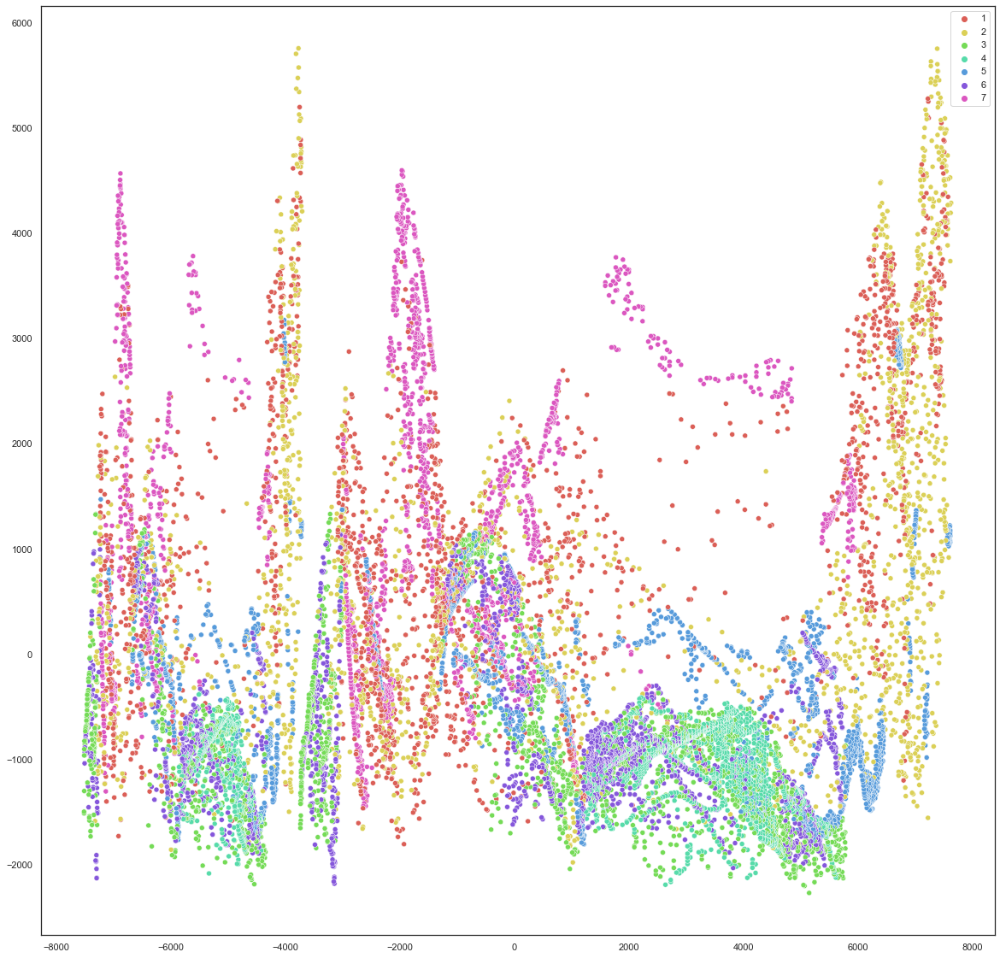

In [16]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_style("white")
palette = sns.color_palette("hls", len(set(y_forest)))        
y = y_forest
# plot
sns.scatterplot(X_pca_forest[:,0],X_pca_forest[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [20]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(X_pca_forest,y))

Time 1.31
Average distance inside/outside class ratio 0.89


## t-SNE (covertype)

In [21]:
start=time.time()
tsne_forest = TSNE(verbose=2)
x_tsne_forest = tsne_forest.fit_transform(x_forest)
total_time=time.time()-start

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14988 samples in 0.056s...
[t-SNE] Computed neighbors for 14988 samples in 6.049s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14988
[t-SNE] Computed conditional probabilities for sample 2000 / 14988
[t-SNE] Computed conditional probabilities for sample 3000 / 14988
[t-SNE] Computed conditional probabilities for sample 4000 / 14988
[t-SNE] Computed conditional probabilities for sample 5000 / 14988
[t-SNE] Computed conditional probabilities for sample 6000 / 14988
[t-SNE] Computed conditional probabilities for sample 7000 / 14988
[t-SNE] Computed conditional probabilities for sample 8000 / 14988
[t-SNE] Computed conditional probabilities for sample 9000 / 14988
[t-SNE] Computed conditional probabilities for sample 10000 / 14988
[t-SNE] Computed conditional probabilities for sample 11000 / 14988
[t-SNE] Computed conditional probabilities for sample 12000 / 14988
[t-SNE] Computed conditional probabilities for sam

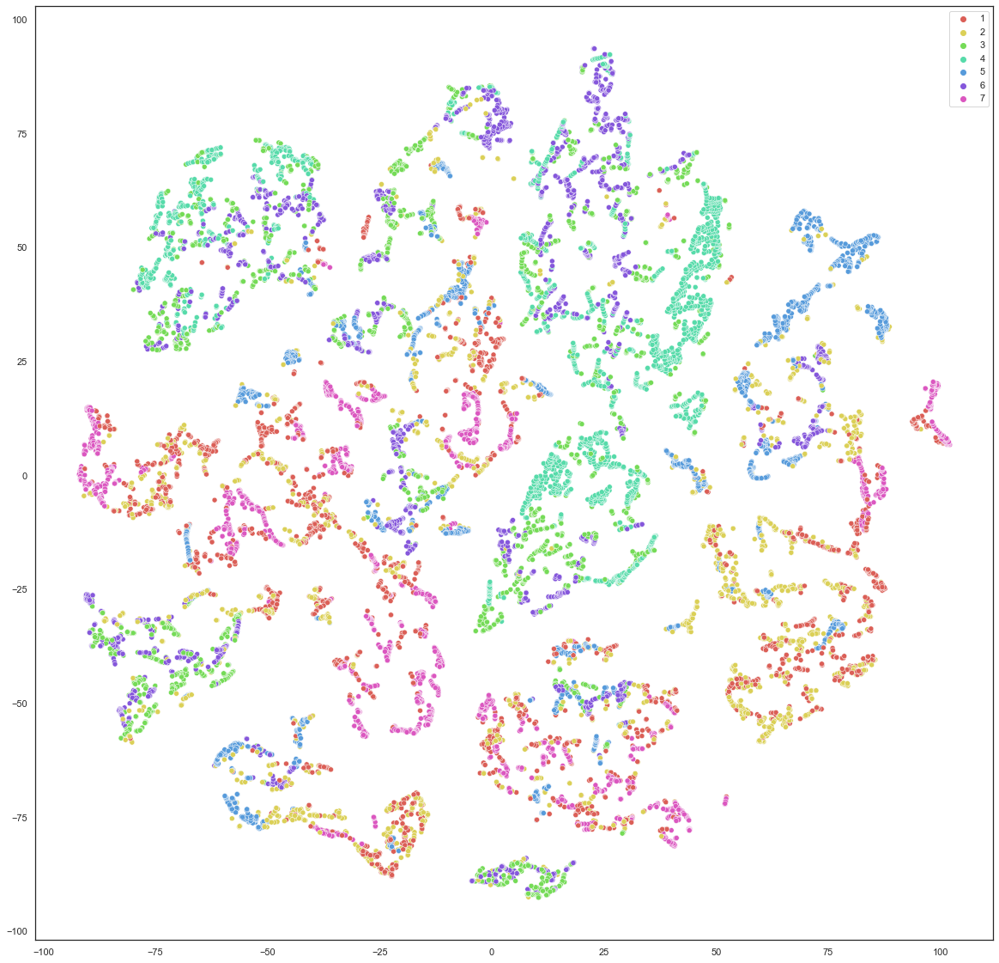

In [22]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_style("white")
palette = sns.color_palette("hls", len(set(y_forest)))        
y = y_forest
# plot
sns.scatterplot(x_tsne_forest[:,0],x_tsne_forest[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [24]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(x_tsne_forest,y))

Time 65.19
Average distance inside/outside class ratio 0.89


## UMAP (covertype)

In [27]:
start=time.time()
forest_reducer = umap.UMAP()
forest_embedding = forest_reducer.fit_transform(x_forest)
total_time=time.time()-start

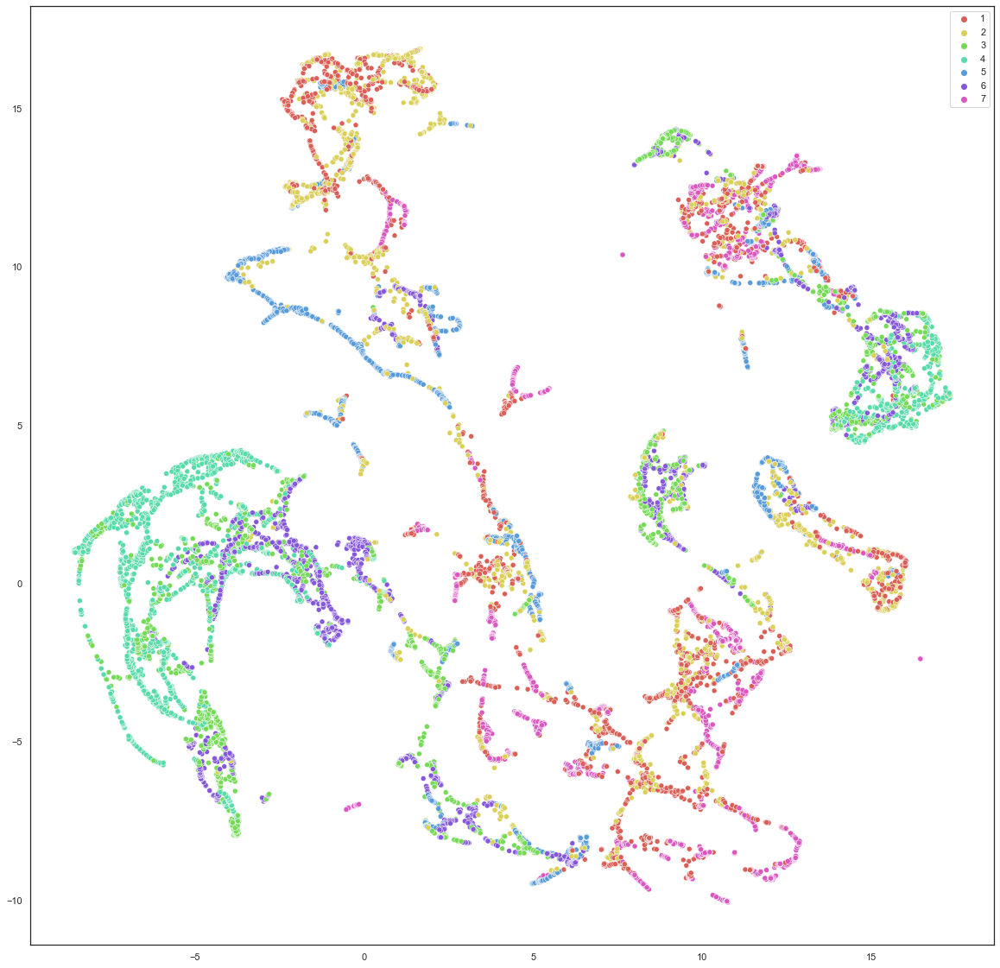

In [28]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_style("white")
palette = sns.color_palette("hls", len(set(y_forest)))        
y = y_forest

sns.scatterplot(forest_embedding[:,0],forest_embedding[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [30]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(forest_embedding,y))

Time 29.88
Average distance inside/outside class ratio 0.88


## TriMap

In [31]:
start=time.time()
embedding_forest = trimap.TRIMAP(n_inliers=20,
                          n_outliers=10,
                          n_random=10,
                          weight_adj=1000.0).fit_transform(x_forest)
total_time=time.time()-start

TRIMAP(n_inliers=20, n_outliers=10, n_random=10, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=1000.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 14988 points with dimension 55
pre-processing
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 6397.251, Violated triplets: 0.2032
Iteration:  200, Loss: 5285.097, Violated triplets: 0.1679
Iteration:  300, Loss: 4971.396, Violated triplets: 0.1579
Iteration:  400, Loss: 4886.468, Violated triplets: 0.1553
Elapsed time: 0:01:04.592552


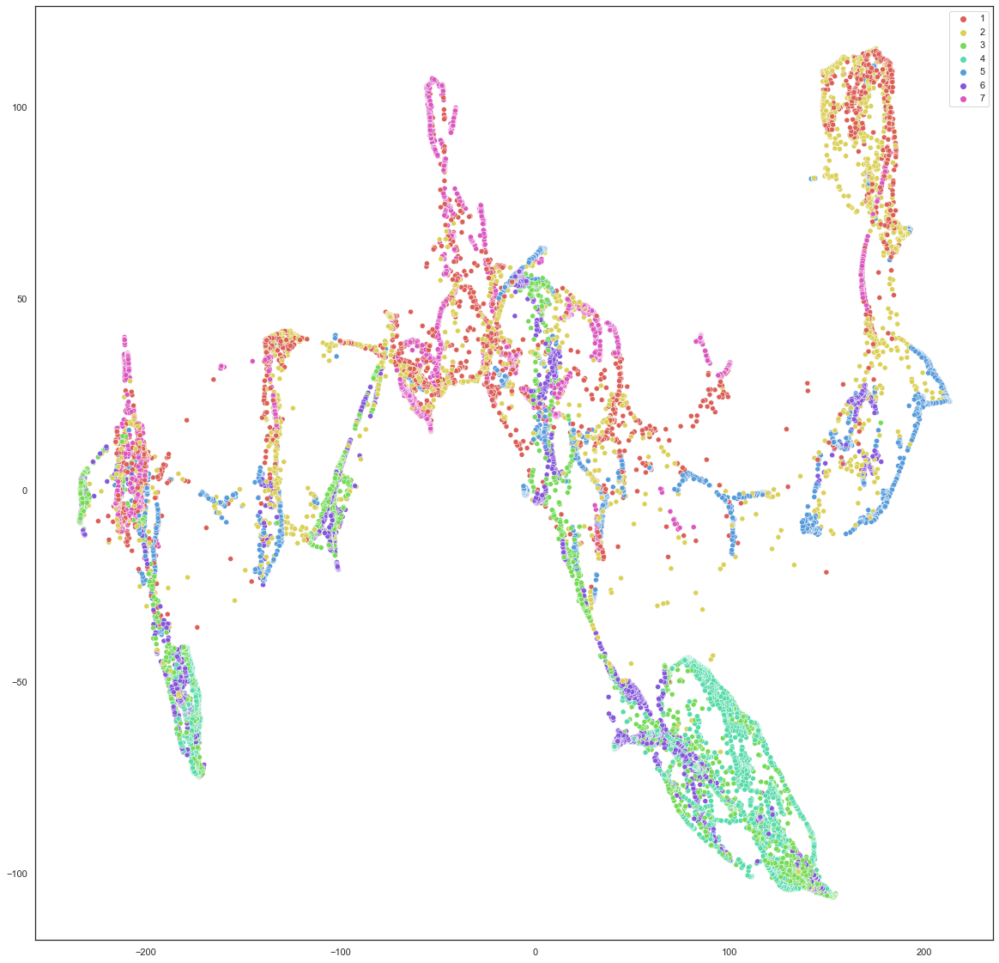

In [32]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_style("white")
palette = sns.color_palette("hls", len(set(y_forest)))        
y = y_forest
# plot
sns.scatterplot(embedding_forest[:,0],embedding_forest[:,1], hue=y, legend='full', palette=palette)

plt.show()

In [33]:
gs = trimap.TRIMAP(verbose=False).global_score(x_forest, embedding_forest)
print("global score %2.2f" % gs)
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(x_forest,y))

global score 0.23
Time 65.04
Average distance inside/outside class ratio 0.90


## LargeVis (covertype)

In [42]:
x_forest

array([[2590,   56,    2, ...,    0,    0,    0],
       [2804,  139,    9, ...,    0,    0,    0],
       [2785,  155,   18, ...,    0,    0,    0],
       ...,
       [3100,  158,    8, ...,    0,    0,    0],
       [3100,  171,   12, ...,    0,    0,    0],
       [3096,  180,   12, ...,    0,    0,    0]], dtype=int64)

In [34]:
np.savetxt('forest_vec784D_trimap.txt', x_forest, delimiter=' ')
np.savetxt('forest_label_trimap.txt', y_forest, delimiter=' ')

In [35]:
with open('forest_vec784D_trimap.txt', 'r') as original: data = original.read()
with open('forest_vec784D_trimap.txt', 'w') as modified: 
    modified.write(str(x_forest.shape[0]) + " " + str(x_forest.shape[1]) + '\n')
    modified.write(data)

In [36]:
start = time.time()
!start LargeVis.exe -input forest_vec784D_trimap.txt -output forest_vec2D_trimap.txt -threads 15

In [37]:
file_data = np.loadtxt("forest_vec2D_trimap.txt", dtype=float)
sliced = file_data[1:,:]

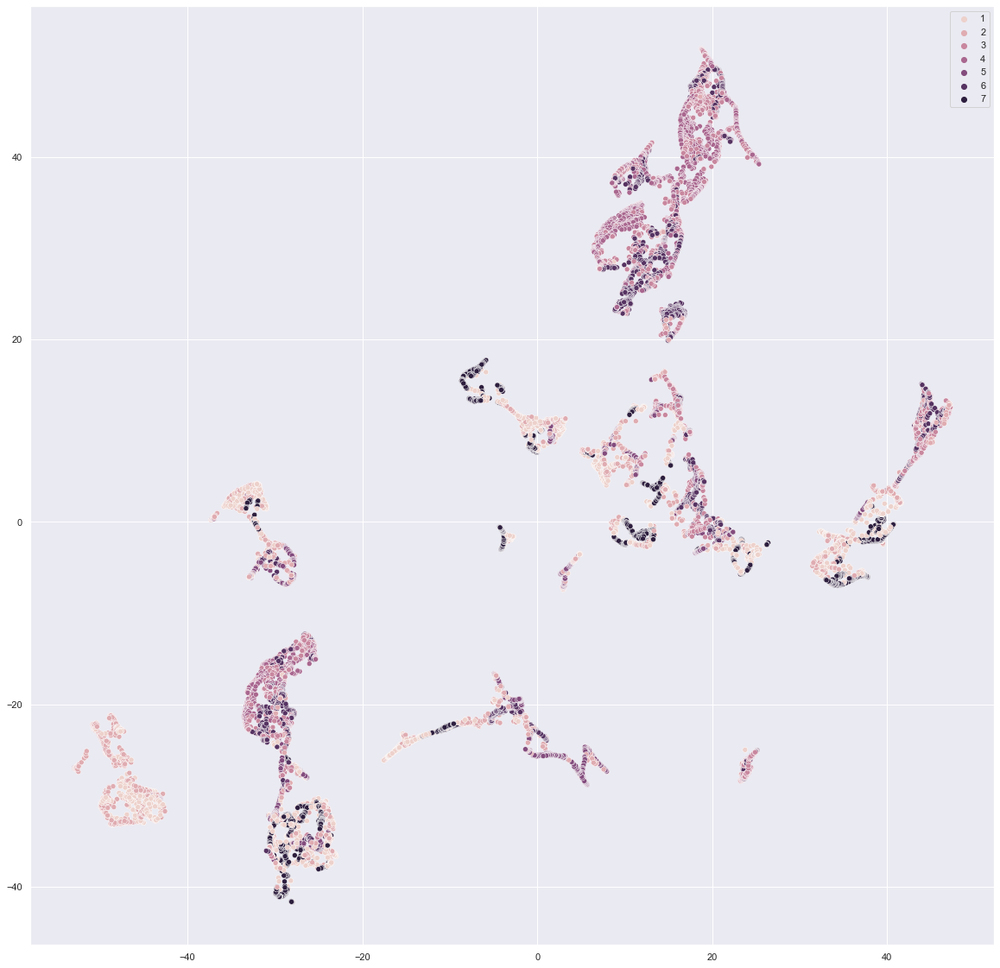

In [38]:
sns.set(rc={'figure.figsize':(20,20)})
palette = sns.color_palette("hls", len(set(y_forest))) 
sns.scatterplot(sliced[:,0],sliced[:,1], hue=y_forest, legend='full')
total_time=time.time()-start

In [40]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(sliced,y_forest))

Time 439.68
Average distance inside/outside class ratio 0.83


# CIFAR-10

In [177]:
from tensorflow.keras.datasets import cifar10
cifar = cifar10.load_data()

In [178]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
               'horse', 'ship', 'truck']

(X_train, y_train), (X_test, y_test) = cifar
y_train = y_train.reshape(y_train.shape[0])
print(X_test.shape)
print(y_train.shape)

(10000, 32, 32, 3)
(50000,)


In [179]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1]*X_train.shape[2] * X_train.shape[3])
X_train /= 255
X_test /= 255


In [180]:
LIMITER = 10000

X_train = X_train[:LIMITER]
y_train = y_train[:LIMITER]

In [181]:
def plot_scatter_for_cifar(X, y):
    fig, plot = plt.subplots()
    fig.set_size_inches(20, 10)
    plt.prism()
    for i, label in zip(range(10), class_names):
        display_n = y == i
        plt.scatter(X[display_n, 0], X[display_n, 1], label = f' {label}')
    plot.set_xticks(())
    plot.set_yticks(())
    

    plt.tight_layout()
    plt.legend()
    plt.show()

## PCA

In [182]:
start=time.time()
pca_cifar = PCA(n_components=2)
X_pca_cifar = pca_cifar.fit_transform(X_train)
total_time=time.time()-start

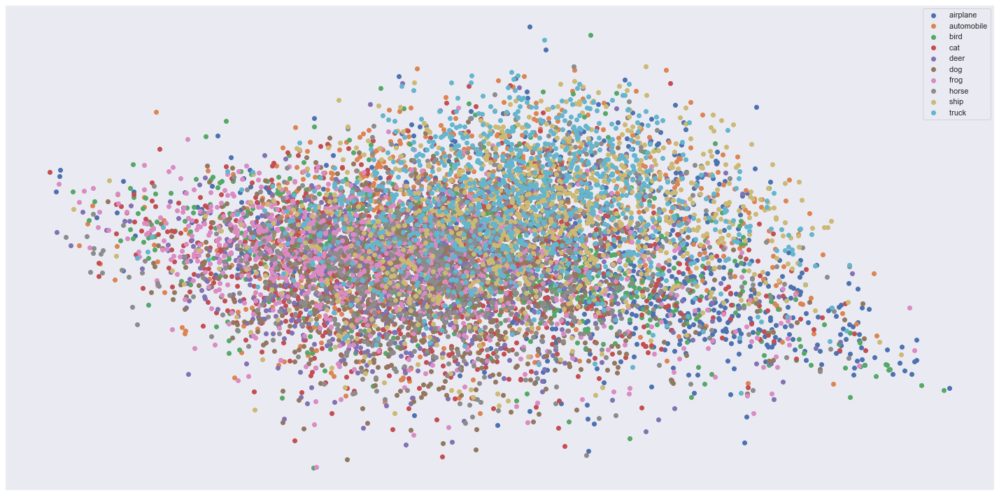

In [183]:
plot_scatter_for_cifar(X_pca_cifar, y_train)

In [184]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(X_pca_cifar, y_train))

Time 3.36
Average distance inside/outside class ratio 0.91


## t-SNE

In [185]:
start=time.time()
tsne_cifar = TSNE(verbose=2)
x_tsne_cifar = tsne_cifar.fit_transform(X_train)
total_time=time.time()-start

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.493s...
[t-SNE] Computed neighbors for 10000 samples in 8.637s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.723430
[t-SNE] Computed conditional probabilities in 1.296s
[t-SNE] Iteration 50: error = 93.7287598, gradient norm = 0.0815725 (50 iterations in 4.418s)
[t-SNE] It

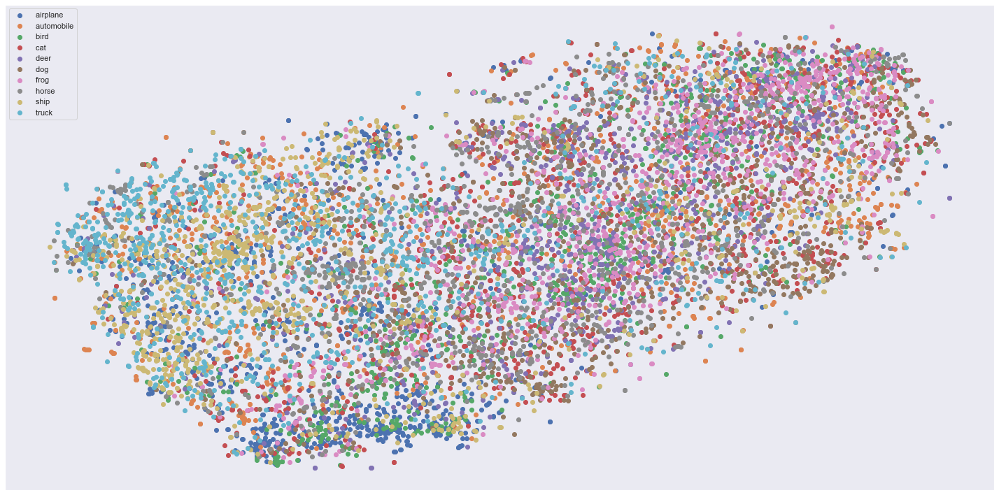

In [186]:
plot_scatter_for_cifar(x_tsne_cifar, y_train)

In [187]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(x_tsne_cifar, y_train))

Time 65.03
Average distance inside/outside class ratio 0.89


## UMAP

In [188]:
start=time.time()
cifar_reducer = umap.UMAP()
cifar_embedding = cifar_reducer.fit_transform(X_train)
total_time=time.time()-start

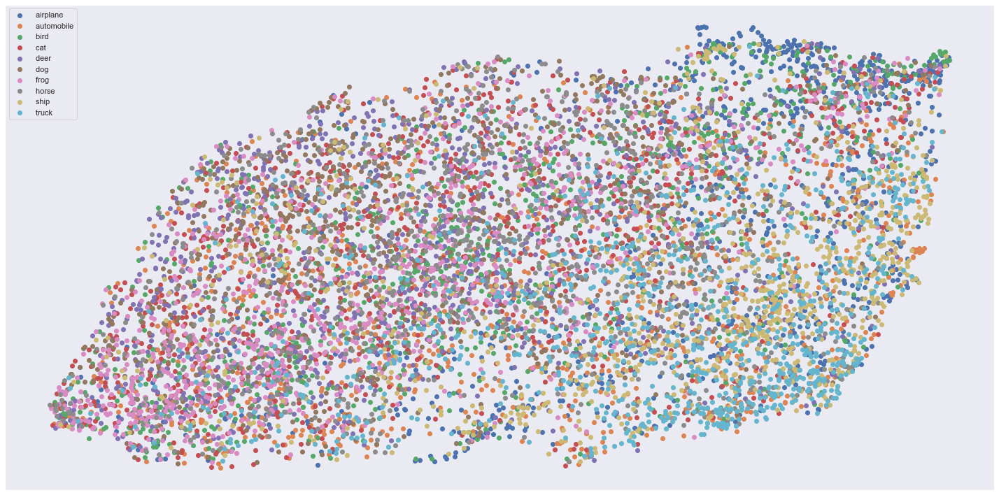

In [189]:
plot_scatter_for_cifar(cifar_embedding, y_train)

In [190]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(cifar_embedding, y_train))

Time 74.83
Average distance inside/outside class ratio 0.89


## TriMap

In [191]:
start=time.time()
embedding_cifar = trimap.TRIMAP(n_inliers=20,
                          n_outliers=10,
                          n_random=10,
                          weight_adj=1000.0).fit_transform(X_train)
total_time=time.time()-start

TRIMAP(n_inliers=20, n_outliers=10, n_random=10, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=1000.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 10000 points with dimension 3072
pre-processing
applied PCA
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 3176.402, Violated triplets: 0.1513
Iteration:  200, Loss: 3129.295, Violated triplets: 0.1490
Iteration:  300, Loss: 3106.465, Violated triplets: 0.1479
Iteration:  400, Loss: 3094.946, Violated triplets: 0.1474
Elapsed time: 0:00:44.110889


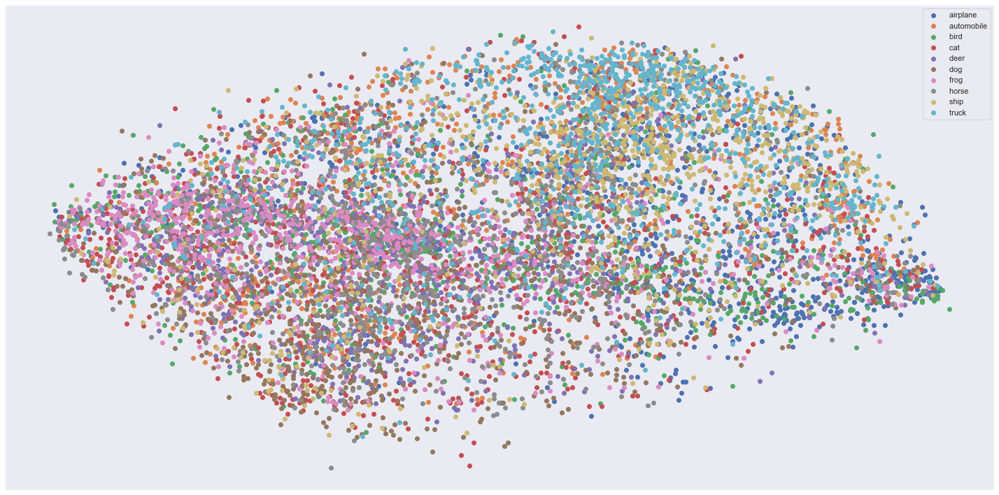

In [192]:
plot_scatter_for_cifar(embedding_cifar, y_train)

In [193]:
gs = trimap.TRIMAP(verbose=False).global_score(X_train, embedding_cifar)
print("global score %2.2f" % gs)
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(embedding_cifar, y_train))

global score 0.96
Time 45.10
Average distance inside/outside class ratio 0.89


## LargeVis

In [194]:
np.savetxt('cifar_vec784D_trimap.txt', X_train, delimiter=' ')
np.savetxt('cifar_label_trimap.txt', y_train, delimiter=' ')

In [195]:
with open('cifar_vec784D_trimap.txt', 'r') as original: data = original.read()
with open('cifar_vec784D_trimap.txt', 'w') as modified: 
    modified.write(str(X_train.shape[0]) + " " + str(X_train.shape[1]) + '\n')
    modified.write(data)

In [196]:
start = time.time()
!start LargeVis.exe -input cifar_vec784D_trimap.txt -output cifar_vec2D_trimap.txt -threads 15

In [198]:
total_time=time.time()-start
file_data = np.loadtxt("cifar_vec2D_trimap.txt", dtype=float)
sliced = file_data[1:,:]

<AxesSubplot:>

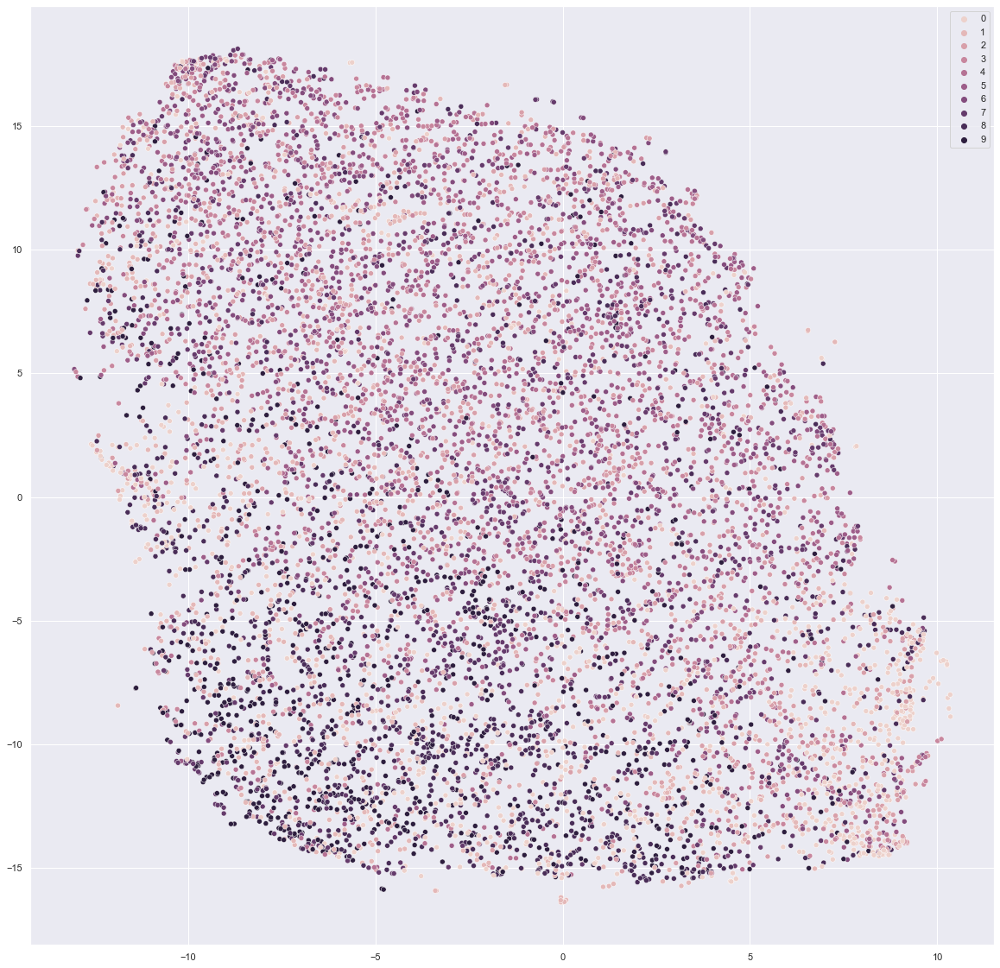

In [199]:
sns.set(rc={'figure.figsize':(20,20)})
palette = sns.color_palette("hls", len(set(y_train))) 
sns.scatterplot(sliced[:,0],sliced[:,1], hue=y_train, legend='full')

In [202]:
print("Time %2.2f" % total_time)
print("Average distance inside/outside class ratio %2.2f" % calculate_metric(sliced, y_train))

Time 528.48
Average distance inside/outside class ratio 0.88


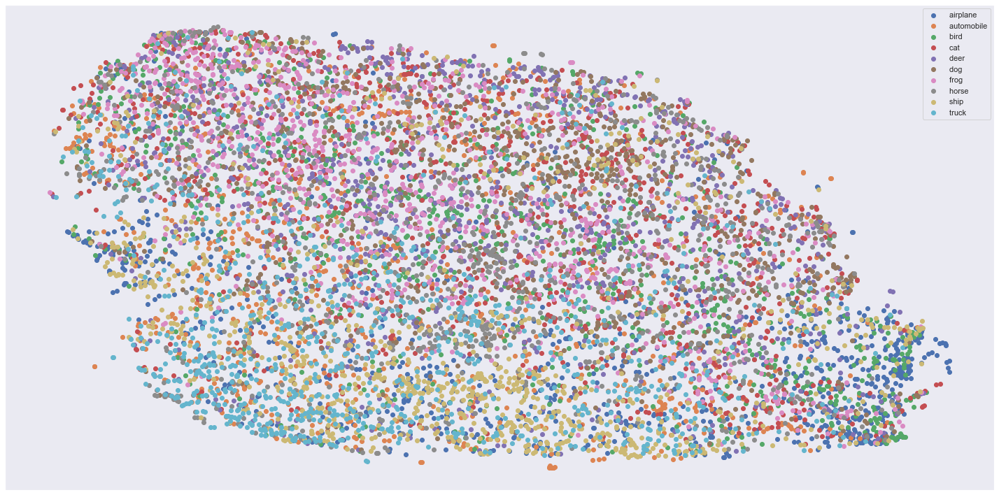

In [203]:
plot_scatter_for_cifar(sliced, y_train)